In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score as r2
import shap

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Open the pickle file
df = pickle.load(open('../../data/processed/merged_data_202507062100.pkl', 'rb'))
df

,AAL_Article Count,AAL_Article Count_cum04,AAL_Article Count_cum08,AAL_Article Count_cum16,AAL_Article Count_cum48,AAL_Article Count_cum96,AAL_Change_Article Count,AAL_Change_Article Count_cum04,AAL_Change_Article Count_cum08,AAL_Change_Article Count_cum16,...,month_of_year_11,month_of_year_12,month_of_year_2,month_of_year_3,month_of_year_4,month_of_year_5,month_of_year_6,month_of_year_7,month_of_year_8,month_of_year_9
2018-01-02 09:30:00,2,2,4,6,48,133,-2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2018-01-02 09:45:00,0,2,4,6,46,133,-2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2018-01-02 10:00:00,1,3,5,7,39,134,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2018-01-02 10:15:00,0,3,5,7,37,133,-1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2018-01-02 10:30:00,0,1,3,7,35,133,0,-2,-2,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-30 14:45:00,0,5,15,29,59,124,-1,-3,-5,-2,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:00:00,3,4,16,30,61,125,3,-1,1,1,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:15:00,1,5,16,30,61,125,-2,1,0,0,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:30:00,1,5,13,30,61,124,0,0,-3,0,...,0,0,0,0,0,1,0,0,0,0


In [3]:
list(df.columns)[-100:]

['general_PCA_GKG1_3_cum96',
 'general_PCA_GKG1_4',
 'general_PCA_GKG1_4_cum04',
 'general_PCA_GKG1_4_cum08',
 'general_PCA_GKG1_4_cum16',
 'general_PCA_GKG1_4_cum48',
 'general_PCA_GKG1_4_cum96',
 'general_PCA_Scored_0',
 'general_PCA_Scored_0_cum04',
 'general_PCA_Scored_0_cum08',
 'general_PCA_Scored_0_cum16',
 'general_PCA_Scored_0_cum48',
 'general_PCA_Scored_0_cum96',
 'general_PCA_Scored_1',
 'general_PCA_Scored_1_cum04',
 'general_PCA_Scored_1_cum08',
 'general_PCA_Scored_1_cum16',
 'general_PCA_Scored_1_cum48',
 'general_PCA_Scored_1_cum96',
 'general_PCA_Scored_2',
 'general_PCA_Scored_2_cum04',
 'general_PCA_Scored_2_cum08',
 'general_PCA_Scored_2_cum16',
 'general_PCA_Scored_2_cum48',
 'general_PCA_Scored_2_cum96',
 'general_PCA_Scored_3',
 'general_PCA_Scored_3_cum04',
 'general_PCA_Scored_3_cum08',
 'general_PCA_Scored_3_cum16',
 'general_PCA_Scored_3_cum48',
 'general_PCA_Scored_3_cum96',
 'general_PCA_Scored_4',
 'general_PCA_Scored_4_cum04',
 'general_PCA_Scored_4_cum0

In [4]:
list(df.columns)

['AAL_Article Count',
 'AAL_Article Count_cum04',
 'AAL_Article Count_cum08',
 'AAL_Article Count_cum16',
 'AAL_Article Count_cum48',
 'AAL_Article Count_cum96',
 'AAL_Change_Article Count',
 'AAL_Change_Article Count_cum04',
 'AAL_Change_Article Count_cum08',
 'AAL_Change_Article Count_cum16',
 'AAL_Change_Article Count_cum16_lag01',
 'AAL_Change_Article Count_cum16_lag02',
 'AAL_Change_Article Count_cum16_lag03',
 'AAL_Change_Article Count_cum16_lag04',
 'AAL_Change_Article Count_cum16_lag05',
 'AAL_Change_Article Count_cum16_lag06',
 'AAL_Change_Article Count_cum16_lag07',
 'AAL_Change_Article Count_cum16_lag08',
 'AAL_Change_Article Count_cum16_lag09',
 'AAL_Change_Article Count_cum16_lag10',
 'AAL_Change_Article Count_cum16_lag11',
 'AAL_Change_Article Count_cum16_lag12',
 'AAL_Change_Article Count_cum16_lag13',
 'AAL_Change_Article Count_cum16_lag14',
 'AAL_Change_Article Count_cum16_lag15',
 'AAL_Change_Article Count_cum16_lag16',
 'AAL_Change_Article Count_cum16_lag17',
 'AAL_C

In [5]:
df.shape

(48281, 11046)

In [28]:
[i for i in df.columns if 'Change_Volume_Day_0' in i]

['AAL_Change_Volume_Day_01',
 'AAL_Change_Volume_Day_02',
 'AAL_Change_Volume_Day_03',
 'AAL_Change_Volume_Day_04',
 'AAL_Change_Volume_Day_05',
 'AAL_Change_Volume_Day_06',
 'AAL_Change_Volume_Day_07',
 'AAL_Change_Volume_Day_08',
 'AAL_Change_Volume_Day_09',
 'ALGT_Change_Volume_Day_01',
 'ALGT_Change_Volume_Day_02',
 'ALGT_Change_Volume_Day_03',
 'ALGT_Change_Volume_Day_04',
 'ALGT_Change_Volume_Day_05',
 'ALGT_Change_Volume_Day_06',
 'ALGT_Change_Volume_Day_07',
 'ALGT_Change_Volume_Day_08',
 'ALGT_Change_Volume_Day_09',
 'ALK_Change_Volume_Day_01',
 'ALK_Change_Volume_Day_02',
 'ALK_Change_Volume_Day_03',
 'ALK_Change_Volume_Day_04',
 'ALK_Change_Volume_Day_05',
 'ALK_Change_Volume_Day_06',
 'ALK_Change_Volume_Day_07',
 'ALK_Change_Volume_Day_08',
 'ALK_Change_Volume_Day_09',
 'BNO_Change_Volume_Day_01',
 'BNO_Change_Volume_Day_02',
 'BNO_Change_Volume_Day_03',
 'BNO_Change_Volume_Day_04',
 'BNO_Change_Volume_Day_05',
 'BNO_Change_Volume_Day_06',
 'BNO_Change_Volume_Day_07',
 'BNO

In [29]:
# Data preprocessing
y_cols = ['AAL_Change_Volume']
x_cols = [
    'AAL_Change_Volume_lag01','AAL_Change_Volume_lag02','AAL_Change_Volume_lag03','AAL_Change_Volume_lag04','AAL_Change_Volume_lag05','AAL_Change_Volume_lag06','AAL_Change_Volume_lag07','AAL_Change_Volume_lag08','AAL_Change_Volume_lag09','ALGT_Change_Volume_lag01','ALGT_Change_Volume_lag02','ALGT_Change_Volume_lag03','ALGT_Change_Volume_lag04','ALGT_Change_Volume_lag05','ALGT_Change_Volume_lag06','ALGT_Change_Volume_lag07','ALGT_Change_Volume_lag08','ALGT_Change_Volume_lag09','ALK_Change_Volume_lag01','ALK_Change_Volume_lag02','ALK_Change_Volume_lag03','ALK_Change_Volume_lag04','ALK_Change_Volume_lag05','ALK_Change_Volume_lag06','ALK_Change_Volume_lag07','ALK_Change_Volume_lag08','ALK_Change_Volume_lag09','BNO_Change_Volume_lag01','BNO_Change_Volume_lag02','BNO_Change_Volume_lag03','BNO_Change_Volume_lag04','BNO_Change_Volume_lag05','BNO_Change_Volume_lag06','BNO_Change_Volume_lag07','BNO_Change_Volume_lag08','BNO_Change_Volume_lag09','DAL_Change_Volume_lag01','DAL_Change_Volume_lag02','DAL_Change_Volume_lag03','DAL_Change_Volume_lag04','DAL_Change_Volume_lag05','DAL_Change_Volume_lag06','DAL_Change_Volume_lag07','DAL_Change_Volume_lag08','DAL_Change_Volume_lag09','ITA_Change_Volume_lag01','ITA_Change_Volume_lag02','ITA_Change_Volume_lag03','ITA_Change_Volume_lag04','ITA_Change_Volume_lag05','ITA_Change_Volume_lag06','ITA_Change_Volume_lag07','ITA_Change_Volume_lag08','ITA_Change_Volume_lag09','IYT_Change_Volume_lag01','IYT_Change_Volume_lag02','IYT_Change_Volume_lag03','IYT_Change_Volume_lag04','IYT_Change_Volume_lag05','IYT_Change_Volume_lag06','IYT_Change_Volume_lag07','IYT_Change_Volume_lag08','IYT_Change_Volume_lag09','JBLU_Change_Volume_lag01','JBLU_Change_Volume_lag02','JBLU_Change_Volume_lag03','JBLU_Change_Volume_lag04','JBLU_Change_Volume_lag05','JBLU_Change_Volume_lag06','JBLU_Change_Volume_lag07','JBLU_Change_Volume_lag08','JBLU_Change_Volume_lag09','JETS_Change_Volume_lag01','JETS_Change_Volume_lag02','JETS_Change_Volume_lag03','JETS_Change_Volume_lag04','JETS_Change_Volume_lag05','JETS_Change_Volume_lag06','JETS_Change_Volume_lag07','JETS_Change_Volume_lag08','JETS_Change_Volume_lag09','LUV_Change_Volume_lag01','LUV_Change_Volume_lag02','LUV_Change_Volume_lag03','LUV_Change_Volume_lag04','LUV_Change_Volume_lag05','LUV_Change_Volume_lag06','LUV_Change_Volume_lag07','LUV_Change_Volume_lag08','LUV_Change_Volume_lag09','UAL_Change_Volume_lag01','UAL_Change_Volume_lag02','UAL_Change_Volume_lag03','UAL_Change_Volume_lag04','UAL_Change_Volume_lag05','UAL_Change_Volume_lag06','UAL_Change_Volume_lag07','UAL_Change_Volume_lag08','UAL_Change_Volume_lag09',

    'AAL_Change_Volume_Day_01','AAL_Change_Volume_Day_02','AAL_Change_Volume_Day_03','AAL_Change_Volume_Day_04','AAL_Change_Volume_Day_05','AAL_Change_Volume_Day_06','AAL_Change_Volume_Day_07','AAL_Change_Volume_Day_08','AAL_Change_Volume_Day_09','ALGT_Change_Volume_Day_01','ALGT_Change_Volume_Day_02','ALGT_Change_Volume_Day_03','ALGT_Change_Volume_Day_04','ALGT_Change_Volume_Day_05','ALGT_Change_Volume_Day_06','ALGT_Change_Volume_Day_07','ALGT_Change_Volume_Day_08','ALGT_Change_Volume_Day_09','ALK_Change_Volume_Day_01','ALK_Change_Volume_Day_02','ALK_Change_Volume_Day_03','ALK_Change_Volume_Day_04','ALK_Change_Volume_Day_05','ALK_Change_Volume_Day_06','ALK_Change_Volume_Day_07','ALK_Change_Volume_Day_08','ALK_Change_Volume_Day_09','BNO_Change_Volume_Day_01','BNO_Change_Volume_Day_02','BNO_Change_Volume_Day_03','BNO_Change_Volume_Day_04','BNO_Change_Volume_Day_05','BNO_Change_Volume_Day_06','BNO_Change_Volume_Day_07','BNO_Change_Volume_Day_08','BNO_Change_Volume_Day_09','DAL_Change_Volume_Day_01','DAL_Change_Volume_Day_02','DAL_Change_Volume_Day_03','DAL_Change_Volume_Day_04','DAL_Change_Volume_Day_05','DAL_Change_Volume_Day_06','DAL_Change_Volume_Day_07','DAL_Change_Volume_Day_08','DAL_Change_Volume_Day_09','ITA_Change_Volume_Day_01','ITA_Change_Volume_Day_02','ITA_Change_Volume_Day_03','ITA_Change_Volume_Day_04','ITA_Change_Volume_Day_05','ITA_Change_Volume_Day_06','ITA_Change_Volume_Day_07','ITA_Change_Volume_Day_08','ITA_Change_Volume_Day_09','IYT_Change_Volume_Day_01','IYT_Change_Volume_Day_02','IYT_Change_Volume_Day_03','IYT_Change_Volume_Day_04','IYT_Change_Volume_Day_05','IYT_Change_Volume_Day_06','IYT_Change_Volume_Day_07','IYT_Change_Volume_Day_08','IYT_Change_Volume_Day_09','JBLU_Change_Volume_Day_01','JBLU_Change_Volume_Day_02','JBLU_Change_Volume_Day_03','JBLU_Change_Volume_Day_04','JBLU_Change_Volume_Day_05','JBLU_Change_Volume_Day_06','JBLU_Change_Volume_Day_07','JBLU_Change_Volume_Day_08','JBLU_Change_Volume_Day_09','JETS_Change_Volume_Day_01','JETS_Change_Volume_Day_02','JETS_Change_Volume_Day_03','JETS_Change_Volume_Day_04','JETS_Change_Volume_Day_05','JETS_Change_Volume_Day_06','JETS_Change_Volume_Day_07','JETS_Change_Volume_Day_08','JETS_Change_Volume_Day_09','LUV_Change_Volume_Day_01','LUV_Change_Volume_Day_02','LUV_Change_Volume_Day_03','LUV_Change_Volume_Day_04','LUV_Change_Volume_Day_05','LUV_Change_Volume_Day_06','LUV_Change_Volume_Day_07','LUV_Change_Volume_Day_08','LUV_Change_Volume_Day_09','UAL_Change_Volume_Day_01','UAL_Change_Volume_Day_02','UAL_Change_Volume_Day_03','UAL_Change_Volume_Day_04','UAL_Change_Volume_Day_05','UAL_Change_Volume_Day_06','UAL_Change_Volume_Day_07','UAL_Change_Volume_Day_08','UAL_Change_Volume_Day_09',
    
        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4','month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12','hour_of_day_9','hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
        'is_open','is_close'
        ]

y = df[y_cols]
x = df[x_cols]
#x = df

In [30]:
# Train/test splitting
split_val  = round(0.7 * len(x))
split_test = round(0.9 * len(x))

x_train = x[:split_val]
x_val   = x[split_val:split_test]
x_test  = x[split_test:]

y_train = y[:split_val]
y_val   = y[split_val:split_test]
y_test  = y[split_test:]

In [31]:
# Normalize the features to [0,1]
sc2 = MinMaxScaler(feature_range=(0, 1))

x_train = sc2.fit_transform(x_train)
x_val   = sc2.transform(x_val)
x_test  = sc2.transform(x_test)

In [32]:
x_train.shape

(33797, 224)

In [33]:
model = MLPRegressor(
    hidden_layer_sizes=(50,50,50),
    activation='relu',
    solver='adam',
    alpha=0.001,
    learning_rate_init=0.01,
    batch_size=1000,
    early_stopping=True,
    n_iter_no_change=200,
    verbose=True,
    max_iter = 20000,
    random_state=42
)

model.fit(x_train, y_train)

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1650: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 531193377939.74224854
Validation score: -0.000163
Iteration 2, loss = 531190272782.13256836
Validation score: -0.000144
Iteration 3, loss = 531068875103.35577393
Validation score: 0.000782
Iteration 4, loss = 529759645893.83917236
Validation score: 0.007148
Iteration 5, loss = 524309774514.30908203
Validation score: 0.025682
Iteration 6, loss = 510611175766.55303955
Validation score: 0.062270
Iteration 7, loss = 492124333840.11590576
Validation score: 0.094573
Iteration 8, loss = 481138170790.06256104
Validation score: 0.114996
Iteration 9, loss = 471032530848.56872559
Validation score: 0.129998
Iteration 10, loss = 464357462814.69354248
Validation score: 0.136445
Iteration 11, loss = 457043611377.66955566
Validation score: 0.155787
Iteration 12, loss = 448966741907.32006836
Validation score: 0.164601
Iteration 13, loss = 442446723298.78802490
Validation score: 0.179426
Iteration 14, loss = 436080445863.95886230
Validation score: 0.187722
Iteration 15, loss = 432751

MLPRegressor(alpha=0.001, batch_size=1000, early_stopping=True,
             hidden_layer_sizes=(50, 50, 50), learning_rate_init=0.01,
             max_iter=20000, n_iter_no_change=200, random_state=42,
             verbose=True)

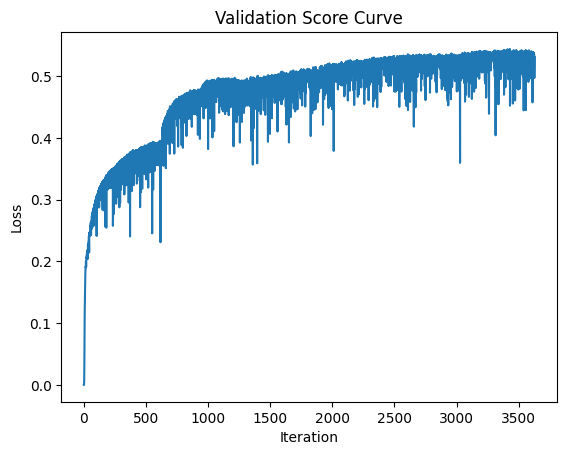

In [34]:
# Graph the training and validation loss
#plt.plot(model.loss_curve_)
plt.plot(model.validation_scores_)
plt.title('Validation Score Curve')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.show()

In [35]:
model.score(x_val, y_val)

0.5578612787992605

In [14]:
model.score(x_train, y_train)

0.16520070165215572

In [18]:
y_pred = model.predict(x_val)
print(round(r2(y_val, y_pred), 3))

-3.13


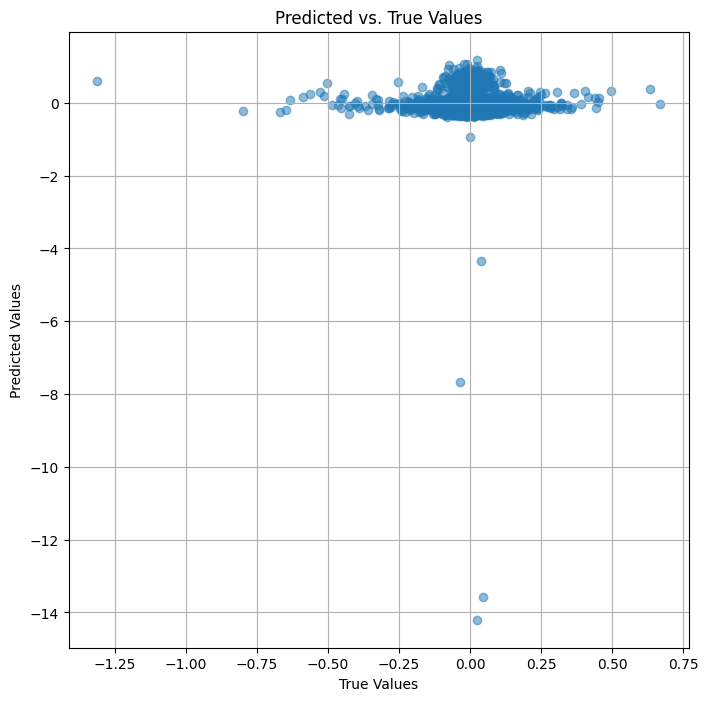

In [25]:
plt.figure(figsize=(8, 8))
plt.scatter(y_val.iloc[:,0], y_pred[:,0], alpha=0.5)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs. True Values")
plt.grid(True)
plt.show()

In [26]:
y_val.iloc[:,0]

2023-03-08 14:30:00    0.0300
2023-03-08 14:45:00    0.0300
2023-03-08 15:00:00   -0.0100
2023-03-08 15:15:00   -0.0200
2023-03-08 15:30:00    0.0100
                        ...  
2024-08-30 11:00:00   -0.0551
2024-08-30 11:15:00   -0.0199
2024-08-30 11:30:00   -0.0450
2024-08-30 11:45:00   -0.0500
2024-08-30 12:00:00   -0.0150
Name: AAL_Change_Open, Length: 9656, dtype: float64

In [160]:
x_val[0]

array([3.66980068e-01, 4.93728607e-01, 5.01999073e-01, 3.73897218e-01,
       4.88884033e-01, 4.90049617e-01, 5.00306373e-01, 4.05262899e-01,
       4.19051083e-01, 3.95219446e-01, 4.61962683e-01, 4.96588018e-01,
       4.88916508e-01, 4.60406956e-01, 4.96140307e-01, 5.02901978e-01,
       4.50757348e-01, 4.51821663e-01, 5.15323990e-01, 4.26765505e-01,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 2.75440705e-01, 4.38356164e-01,
       3.82255639e-01, 3.85040374e-01, 3.96133094e-01, 3.82762487e-01,
       3.90296365e-01, 3.47617445e-01, 3.83356287e-01, 4.02591600e-01,
      

In [159]:
y_pred

array([  43233.00469993,  -66739.58639703,  -90750.87097692, ...,
        183471.05816173, -247595.83811078, -106768.80970552])

In [121]:
# random sample of x_val
x_sample = pd.DataFrame(x_val[np.random.choice(x_val.shape[0], 100, replace=False)], columns=x_cols)

kernel_explainer = shap.KernelExplainer(model.predict, x_sample, seed=1234)
shap_values = kernel_explainer(x_sample)

100%|██████████| 100/100 [02:16<00:00,  1.37s/it]


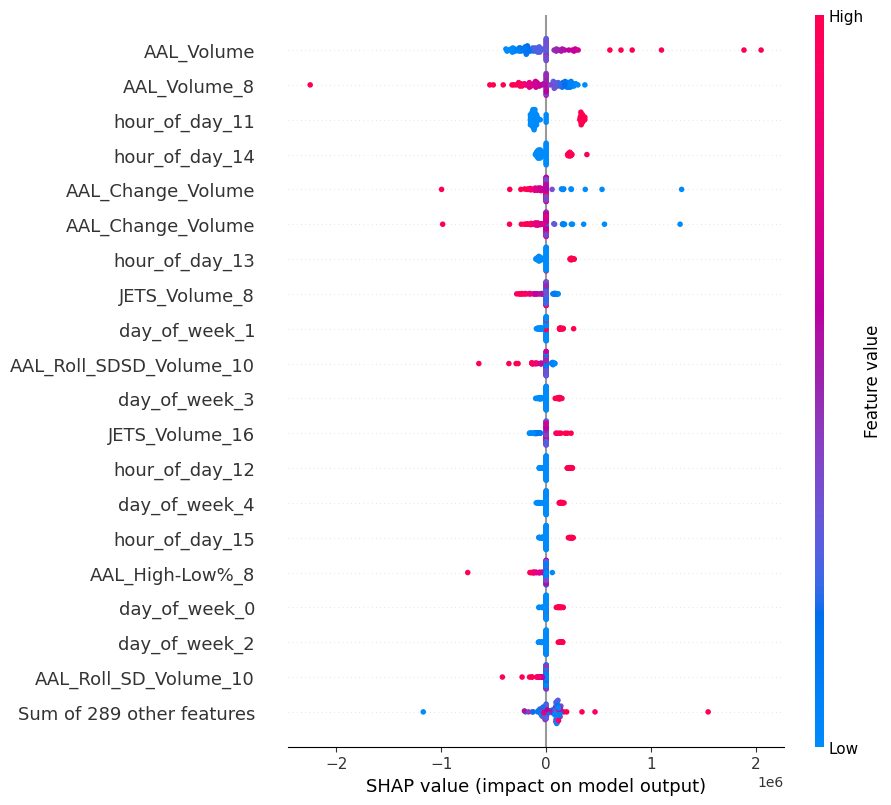

In [122]:
shap.plots.beeswarm(shap_values, max_display=20)